In [18]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.ticker as mtick
plt.style.use('ggplot')
import seaborn as sns
pd.options.display.float_format = '{:,.0f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import dataframe_image as dfi
from pandas.api.types import CategoricalDtype
from matplotlib.ticker import MultipleLocator, FuncFormatter

In [19]:
Accepted_Rejected = pd.read_csv('Accepted_Rejected.csv')
Accepted_Only = pd.read_csv('Accepted_Only.csv')

In [20]:
#Single Year Copies
Accepted_Rejected_2017 = Accepted_Rejected[Accepted_Rejected['Year'] == 2017]
Accepted_Only_2017 = Accepted_Only[Accepted_Only['Year'] == 2017]

#Paid vs Charged Off Copies
Accepted_Only_Paid = Accepted_Only[Accepted_Only['Loan_Status'] == 'Fully Paid']
Accepted_Only_ChargedOff = Accepted_Only[Accepted_Only['Loan_Status'] == 'Charged Off']

In [4]:
#Set order for Employment Length in Accepted_Rejected
emp_length_order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years', '10+ years']
cat_type = CategoricalDtype(categories=emp_length_order, ordered=True)

Accepted_Rejected['Employment_Length'] = Accepted_Rejected['Employment_Length'].astype(cat_type)

In [5]:
#Set order for Employment Length in Accepted_Only
emp_length_order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years', '10+ years']
cat_type = CategoricalDtype(categories=emp_length_order, ordered=True)

Accepted_Only['Employment_Length'] = Accepted_Only['Employment_Length'].astype(cat_type)

In [6]:
mixed_cols = [col for col in Accepted_Rejected.columns if Accepted_Rejected[col].apply(type).nunique() > 1]
print('Mixed Type Columns:', mixed_cols)

Mixed Type Columns: []


In [121]:
print('Min DTI:', Accepted_Only['Debt-Income'].min())
print('Max DTI:', Accepted_Only['Debt-Income'].max())
print(Accepted_Only['Home_Ownership'].value_counts(dropna=False).sort_index())

Min DTI: 0.0
Max DTI: 999.0
Home_Ownership
ANY            267
MORTGAGE    630519
NONE            47
OTHER          179
OWN         129375
RENT        509106
Name: count, dtype: int64


In [8]:
Accepted_Rejected.head()

,Loan_Amount,Risk_Score,Debt-Income,State,Employment_Length,Year,Application
0,"3,600",677,6,PA,10+ years,2015,Accepted
1,"24,700",717,16,SD,10+ years,2015,Accepted
2,"20,000",697,11,IL,10+ years,2015,Accepted
3,"35,000",787,17,NJ,10+ years,2015,Accepted
4,"10,400",697,25,PA,3 years,2015,Accepted


In [9]:
#---ACCEPTED_REJECTED Plotting---

In [30]:
def stacked_density_with_stats_boxes(col, trim_max=None):
    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 6), dpi=150)
    
    #Extreme values
    df = Accepted_Rejected.copy()
    df = df[df[col].notna()]
    df = df[df[col] >= 0]
    if trim_max is not None:
        df = df[df[col] <= trim_max]
    
    # Stats
    stats = {}
    for app, color in zip(['Accepted', 'Rejected'], ['green', 'red']):
        subset = df[df['Application'] == app]
        stats[app] = {
            'color': color,
            'mean': subset[col].mean(),
            'min': subset[col].min(),
            'max': subset[col].max(),
            'count': subset[col].count()
        }
    
    #KDEs
    for app, s in stats.items():
        subset = df[df['Application'] == app]
        sns.kdeplot(
            data=subset,
            x=col,
            fill=True,
            label=app,
            color=s['color'],
            alpha=0.6,
            legend=False
        )
        plt.axvline(s['min'], color=s['color'], linestyle=':', linewidth=1.5)
        plt.axvline(s['mean'], color=s['color'], linestyle='--', linewidth=2)
        plt.axvline(s['max'], color=s['color'], linestyle=':', linewidth=1.5)
    
    ymax = plt.gca().get_ylim()[1]
    
    #Text Boxes
    text_positions = {
        'Accepted': {'xpos': df[col].max(), 'ha': 'right', 'ypos': ymax*0.95},
        'Rejected': {'xpos': df[col].min(), 'ha': 'left', 'ypos': ymax*0.95}
    }
    for app, s in stats.items():
        pos = text_positions[app]
        plt.text(
            pos['xpos'], pos['ypos'],
            f"{app}\nMean: {s['mean']:.2f}\nMin: {s['min']:.2f}\nMax: {s['max']:.2f}\nCount: {s['count']:,}",
            color=s['color'], ha=pos['ha'], va='top', fontsize=11, fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor=s['color'])
        )
    
    plt.title(f'Layered Density of {col} by Application Status', fontsize=18, pad=20)
    plt.xlabel(col, fontsize=15)
    plt.ylabel('Density', fontsize=15)
    
    if trim_max is not None:
        plt.xlim(0, trim_max)
    
    plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))
    plt.tight_layout()
    plt.show()

In [21]:
def stacked_hist_acceptance(col, bins=100, xformat='number', max_clip=None, alpha=0.6): 
    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 6), dpi=150)
    
    # --- Clip extreme values to avoid huge axes ---
    df = Accepted_Rejected.copy()
    df = df[df[col].notna()]
    df = df[df[col] >= 0]  # remove negative values
    
    if max_clip is not None:
        df[col] = df[col].clip(upper=max_clip)
    
    # --- Plot histogram ---
    sns.histplot(
        data=df,
        x=col,
        hue='Application',
        multiple='layer',
        bins=bins,
        palette={'Accepted': 'green', 'Rejected': 'red'},
        alpha=alpha,
        edgecolor=None,
        legend=False
    )
    
    # --- Compute stats ---
    accepted = df[df['Application'] == 'Accepted'][col]
    rejected = df[df['Application'] == 'Rejected'][col]
    
    stats = {
        'Accepted': {
            'color': 'green',
            'mean': accepted.mean(),
            'min': accepted.min(),
            'max': accepted.max(),
            'count': accepted.count(),
            'ha': 'right',
            'xpos': df[col].max()
        },
        'Rejected': {
            'color': 'red',
            'mean': rejected.mean(),
            'min': rejected.min(),
            'max': rejected.max(),
            'count': rejected.count(),
            'ha': 'left',
            'xpos': df[col].min()
        }
    }
    
    ymax = plt.gca().get_ylim()[1]
    
    # --- Plot vertical lines & text boxes ---
    for status, s in stats.items():
        color = s['color']
        plt.axvline(s['min'], color=color, linestyle=':', linewidth=1.5)
        plt.axvline(s['mean'], color=color, linestyle='--', linewidth=2)
        plt.axvline(s['max'], color=color, linestyle=':', linewidth=1.5)
        
        plt.text(
            s['xpos'], ymax * 0.95,
            f"{status}\nMean: {s['mean']:.0f}\nMin: {s['min']:.0f}\nMax: {s['max']:.0f}\nCount: {s['count']:,}",
            color=color, ha=s['ha'], va='top', fontsize=11, fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor=color)
        )
    
    # --- Styling ---
    plt.title(f'Histogram of {col} by Acceptance', fontsize=18, pad=20)
    plt.xlabel(col, fontsize=15)
    plt.ylabel('Count', fontsize=15)
    
    # Dynamic tick spacing
    xmin, xmax = plt.gca().get_xlim()
    tickspace = max(1, (xmax - xmin) / 10)
    plt.gca().xaxis.set_major_locator(MultipleLocator(tickspace))
    
    if xformat == 'percent':
        plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}%'))
    else:
        plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
    
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
    plt.tight_layout()
    plt.show()

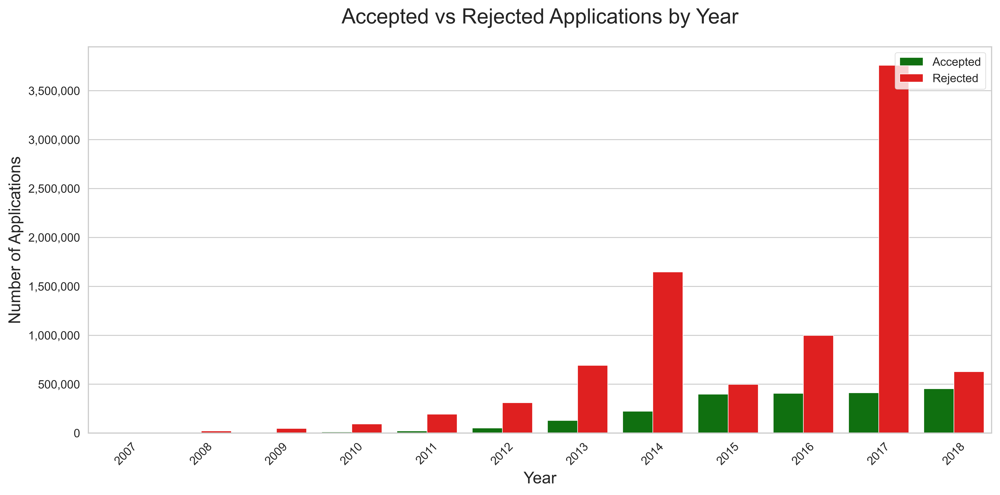

In [10]:
#Barplot- Applications Status Counts by Year
col = 'Year'

accepted_counts = (Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index())
rejected_counts = (Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index())

#Combine counts
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: col_vals,
    'Accepted': accepted_counts.reindex(col_vals, fill_value=0).values,
    'Rejected': rejected_counts.reindex(col_vals, fill_value=0).values
})

#Convert for Seaborn
melted = combined.melt(
    id_vars=col,
    value_vars=['Accepted', 'Rejected'],
    var_name='Application_Status',
    value_name='Count'
)

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=melted,
    x=col,
    y='Count',
    hue='Application_Status',
    hue_order=['Accepted', 'Rejected'],
    palette=['green', 'red'],
)

plt.title(f'Accepted vs Rejected Applications by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Number of Applications', fontsize=15)
plt.xticks(rotation=45)
plt.legend(title='', loc='upper right')
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

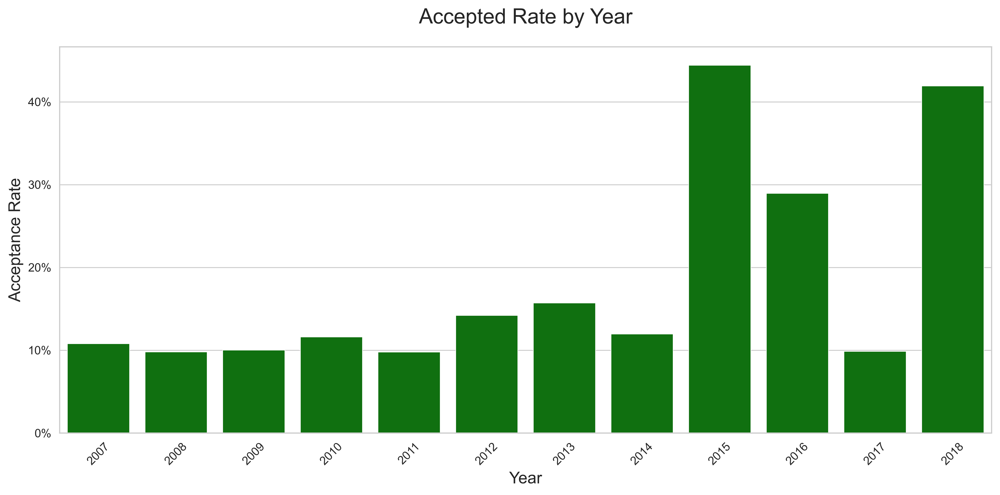

In [11]:
#Barplot- Applications ACCEPTANCE RATES by Year
col = 'Year'

accepted_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index()
rejected_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index()

#Combine
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: col_vals,
    'Accepted': accepted_counts.reindex(col_vals, fill_value=0).values,
    'Rejected': rejected_counts.reindex(col_vals, fill_value=0).values
})

#Calculate accepted rate
combined['Accepted_Rate'] = combined['Accepted'] / (combined['Accepted'] + combined['Rejected'])

#Plot
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=combined,
    x=col,
    y='Accepted_Rate',
    color='green'
)
plt.title(f'Accepted Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1, decimals=0))
plt.tight_layout()
plt.show()

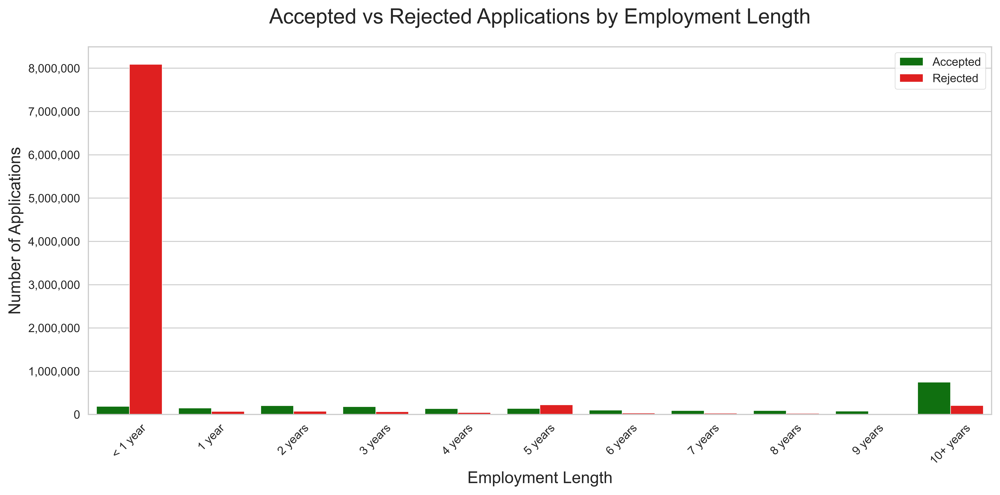

In [12]:
#Barplot- Applications Status Counts by Employment Length
col = 'Employment_Length'

accepted_counts = Accepted_Rejected[Accepted_Rejected['Application'] == 'Accepted'][col].value_counts().sort_index()
rejected_counts = Accepted_Rejected[Accepted_Rejected['Application'] == 'Rejected'][col].value_counts().sort_index()

#Combine
lengths = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    'Employment_Length': emp_length_order,
    'Accepted': accepted_counts.reindex(emp_length_order, fill_value=0).values,
    'Rejected': rejected_counts.reindex(emp_length_order, fill_value=0).values
})

#Convert for Seaborn
melted = combined.melt(
    id_vars='Employment_Length',
    value_vars=['Accepted', 'Rejected'],
    var_name='Application_Status',
    value_name='Count'
)

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=melted,
    x='Employment_Length',
    y='Count',
    hue='Application_Status',
    palette=['green', 'red'],
)

plt.title('Accepted vs Rejected Applications by Employment Length', fontsize=18, pad=20)
plt.xlabel('Employment Length', fontsize=15)
plt.ylabel('Number of Applications', fontsize=15)
plt.xticks(rotation=45)
plt.legend(title='', loc='upper right')
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

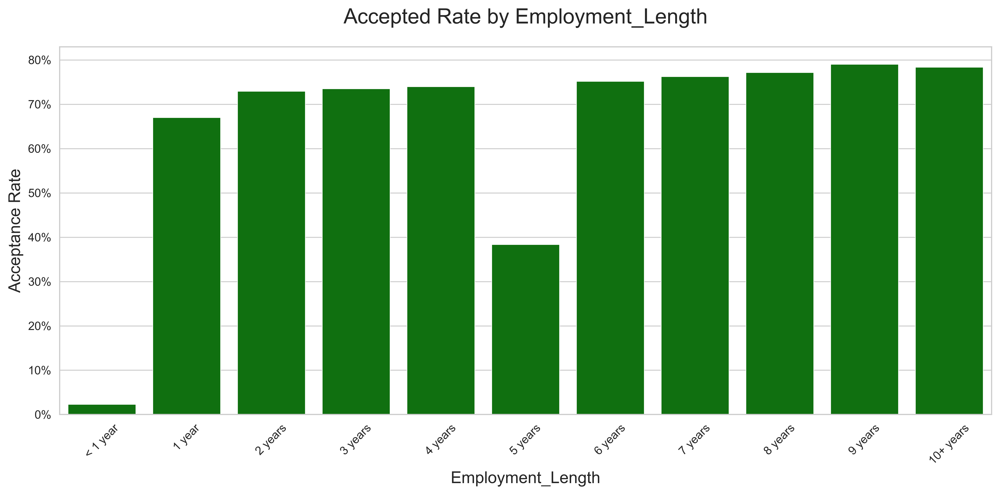

In [13]:
#Barplot- Applications ACCEPTANCE RATES by Employment Length
col = 'Employment_Length'

accepted_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index()
rejected_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index()

#Combine
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: emp_length_order,
    'Accepted': accepted_counts.reindex(emp_length_order, fill_value=0).values,
    'Rejected': rejected_counts.reindex(emp_length_order, fill_value=0).values
})

#Calculate accepted rate
combined['Accepted_Rate'] = combined['Accepted'] / (combined['Accepted'] + combined['Rejected'])

#Plot
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=combined,
    x=col,
    y='Accepted_Rate',
    color='green'
)
plt.title(f'Accepted Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1, decimals=0))
plt.tight_layout()
plt.show()

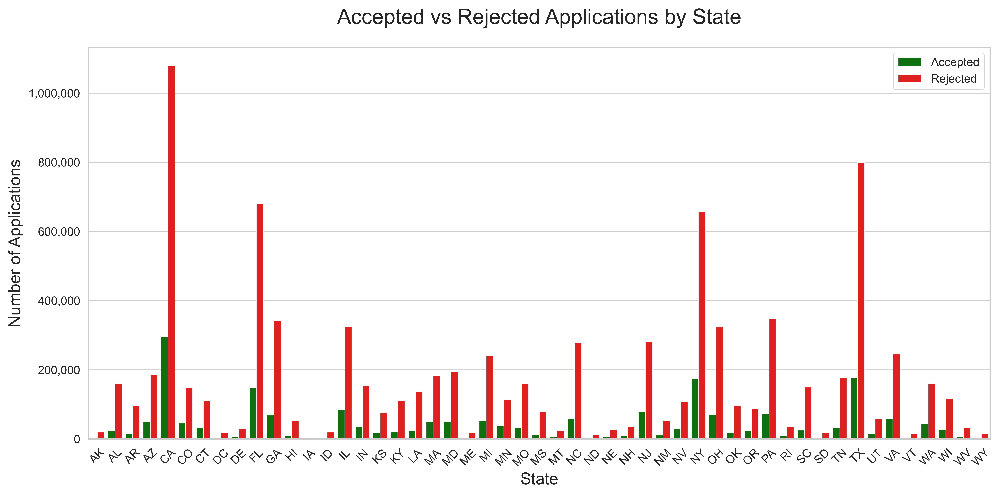

In [14]:
#Barplot- Applications Status Counts by State
col = 'State'

accepted_counts = (Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index())
rejected_counts = (Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index())

#Combine counts
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: col_vals,
    'Accepted': accepted_counts.reindex(col_vals, fill_value=0).values,
    'Rejected': rejected_counts.reindex(col_vals, fill_value=0).values
})

#Convert for Seaborn
melted = combined.melt(
    id_vars=col,
    value_vars=['Accepted', 'Rejected'],
    var_name='Application_Status',
    value_name='Count'
)

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=melted,
    x=col,
    y='Count',
    hue='Application_Status',
    hue_order=['Accepted', 'Rejected'],
    palette=['green', 'red'],
)

plt.title(f'Accepted vs Rejected Applications by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Number of Applications', fontsize=15)
plt.xticks(rotation=45)
plt.legend(title='', loc='upper right')
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

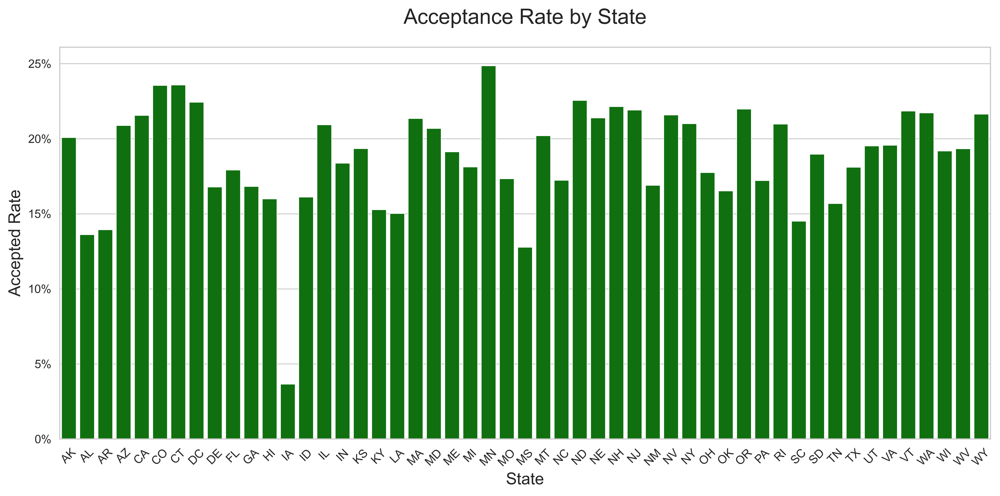

In [15]:
#Barplot- Applications ACCEPTANCE RATES by State
col = 'State'

accepted_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index()
rejected_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index()

#Combine
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: col_vals,
    'Accepted': accepted_counts.reindex(col_vals, fill_value=0).values,
    'Rejected': rejected_counts.reindex(col_vals, fill_value=0).values
})

#Calculate accepted rate
combined['Accepted_Rate'] = combined['Accepted'] / (combined['Accepted'] + combined['Rejected'])

#Plot
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=combined,
    x=col,
    y='Accepted_Rate',
    color='green'
)
plt.title(f'Acceptance Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Accepted Rate', fontsize=15)
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1, decimals=0))
plt.tight_layout()
plt.show()

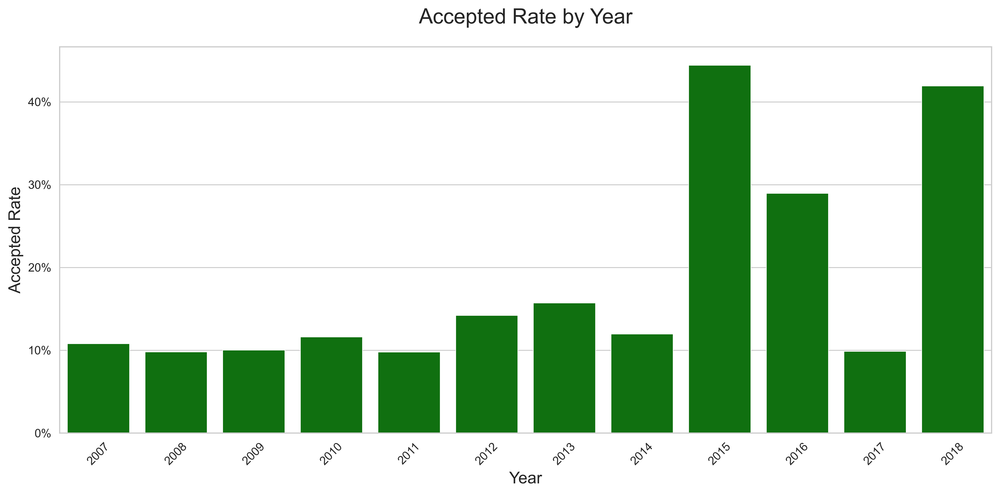

In [16]:
#Barplot- Applications ACCEPTANCE RATES by State
col = 'Year'

accepted_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Accepted', col].value_counts().sort_index()
rejected_counts = Accepted_Rejected.loc[Accepted_Rejected['Application'] == 'Rejected', col].value_counts().sort_index()

#Combine
col_vals = sorted(set(accepted_counts.index) | set(rejected_counts.index))
combined = pd.DataFrame({
    col: col_vals,
    'Accepted': accepted_counts.reindex(col_vals, fill_value=0).values,
    'Rejected': rejected_counts.reindex(col_vals, fill_value=0).values
})

#Calculate accepted rate
combined['Accepted_Rate'] = combined['Accepted'] / (combined['Accepted'] + combined['Rejected'])

#Plot
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.barplot(
    data=combined,
    x=col,
    y='Accepted_Rate',
    color='green'
)
plt.title(f'Accepted Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Accepted Rate', fontsize=15)
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1, decimals=0))
plt.tight_layout()
plt.show()

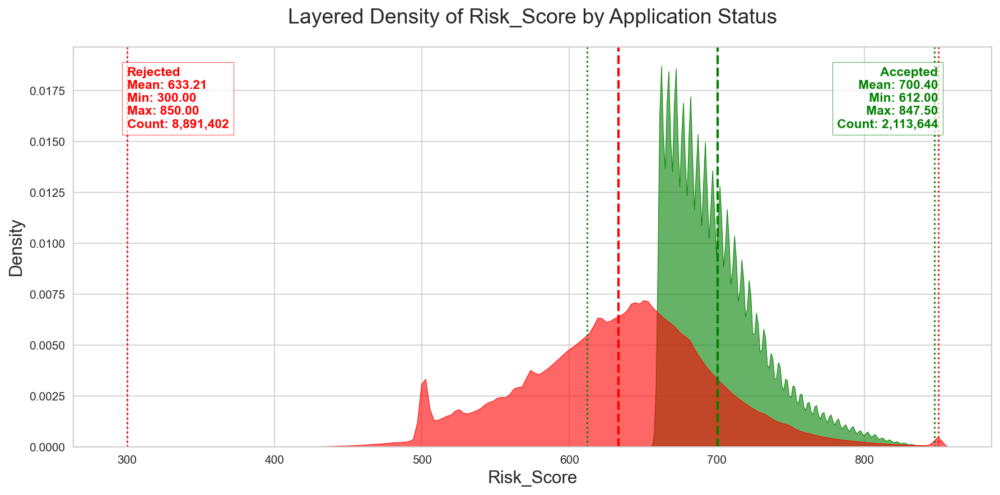

In [32]:
stacked_density_with_stats_boxes('Risk_Score', 850)

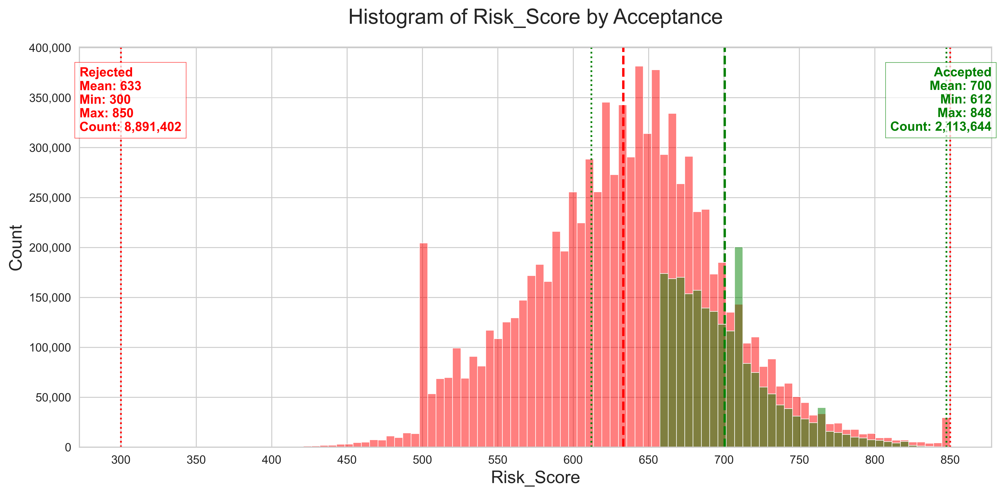

In [10]:
stacked_hist_acceptance('Risk_Score', tickspace=50, bins=100)

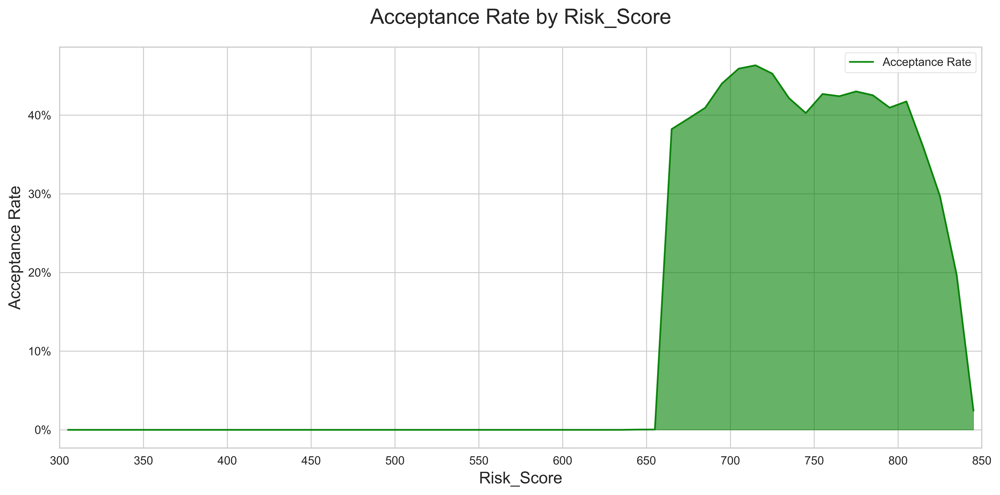

In [18]:
#Bin ACCEPTANCE RATE by Risk Score
col = 'Risk_Score'

bins = np.arange(300, 851, 10)
Accepted_Rejected['Bin'] = pd.cut(Accepted_Rejected[col], bins)

#Calculate acceptance rate per bin
rate_df = Accepted_Rejected.groupby('Bin', observed=False)['Application'].value_counts().unstack(fill_value=0)
rate_df['Acceptance_Rate'] = rate_df.get('Accepted', 0) / (rate_df.get('Accepted', 0) + rate_df.get('Rejected', 0))

#Use bin midpoints for plotting
bin_midpoints = [interval.mid for interval in rate_df.index]

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

plt.fill_between(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.6)
plt.plot(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.9, label='Acceptance Rate')

plt.title(f'Acceptance Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xlim(300, 850)
plt.gca().xaxis.set_major_locator(MultipleLocator(50))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y*100)}%'))
plt.legend(title='')
plt.tight_layout()
plt.show()

C:\Users\edjwe\AppData\Local\Temp\ipykernel_10256\1738615606.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data=Accepted_Rejected_trimmed[Accepted_Rejected['Application'] == 'Accepted'],
C:\Users\edjwe\AppData\Local\Temp\ipykernel_10256\1738615606.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data=Accepted_Rejected_trimmed[Accepted_Rejected['Application'] == 'Rejected'],


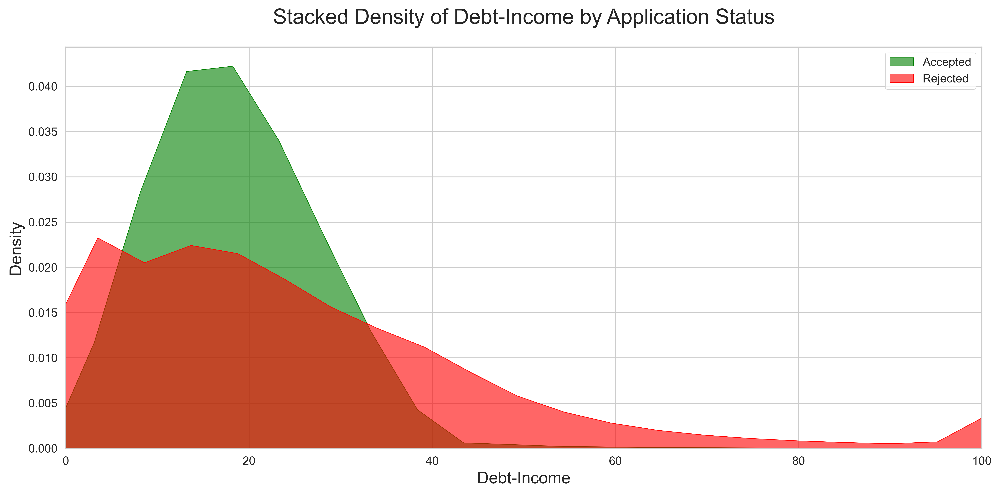

In [19]:
#Stacked Density- Accepted vs Rejected by Debt-Income
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

Accepted_Rejected_trimmed = Accepted_Rejected[Accepted_Rejected['Debt-Income'] < 1000]
sns.kdeplot(
    data=Accepted_Rejected_trimmed[Accepted_Rejected['Application'] == 'Accepted'],
    x='Debt-Income',
    fill=True,
    label='Accepted',
    color='green',
    alpha=0.6
)
sns.kdeplot(
    data=Accepted_Rejected_trimmed[Accepted_Rejected['Application'] == 'Rejected'],
    x='Debt-Income',
    fill=True,
    label='Rejected',
    color='red',
    alpha=0.6
)

plt.title('Stacked Density of Debt-Income by Application Status', fontsize=18, pad=20)
plt.xlabel('Debt-Income', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.legend(title='')
plt.xlim(0, 100)
#plt.gca().xaxis.set_major_locator(MultipleLocator(50))
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

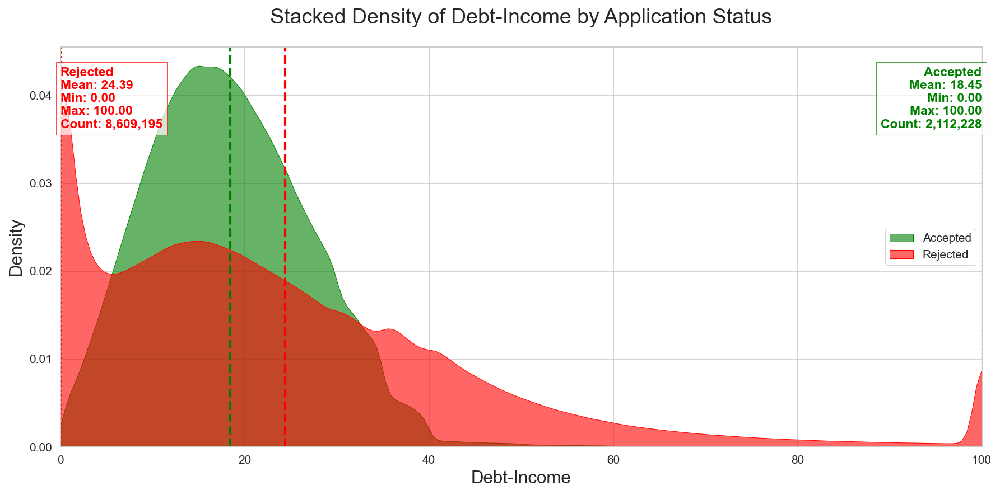

In [29]:
stacked_density_with_stats_boxes('Debt-Income', 100)

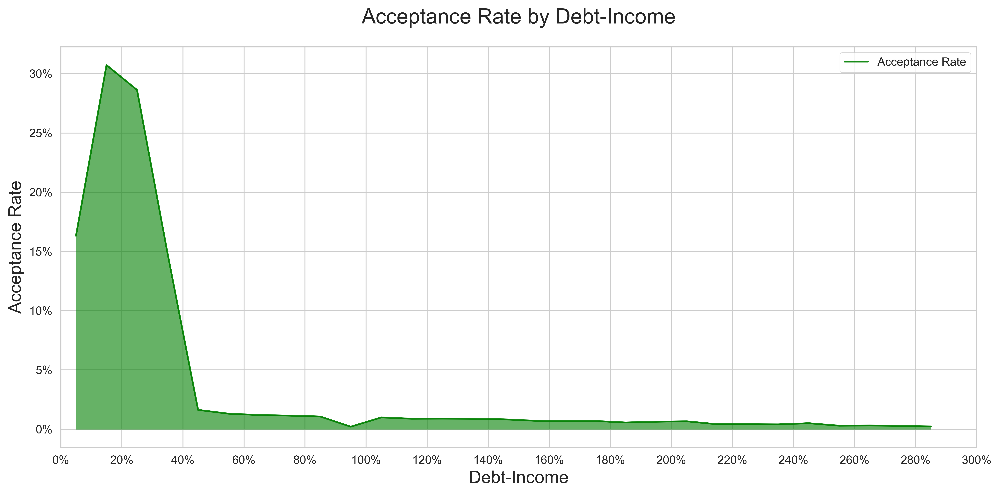

In [122]:
#Bin ACCEPTANCE RATE by Risk Score
col = 'Debt-Income'

bins = np.arange(0, 300, 10)
Accepted_Rejected['Bin'] = pd.cut(Accepted_Rejected[col], bins)

#Calculate acceptance rate per bin
rate_df = Accepted_Rejected.groupby('Bin', observed=False)['Application'].value_counts().unstack(fill_value=0)
rate_df['Acceptance_Rate'] = rate_df.get('Accepted', 0) / (rate_df.get('Accepted', 0) + rate_df.get('Rejected', 0))

#Use bin midpoints for plotting
bin_midpoints = [interval.mid for interval in rate_df.index]

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

plt.fill_between(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.6)
plt.plot(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.9, label='Acceptance Rate')

plt.title(f'Acceptance Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xlim(0, 300)
plt.gca().xaxis.set_major_locator(MultipleLocator(20))
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}%'))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y*100)}%'))
plt.legend(title='')
plt.tight_layout()
plt.show()

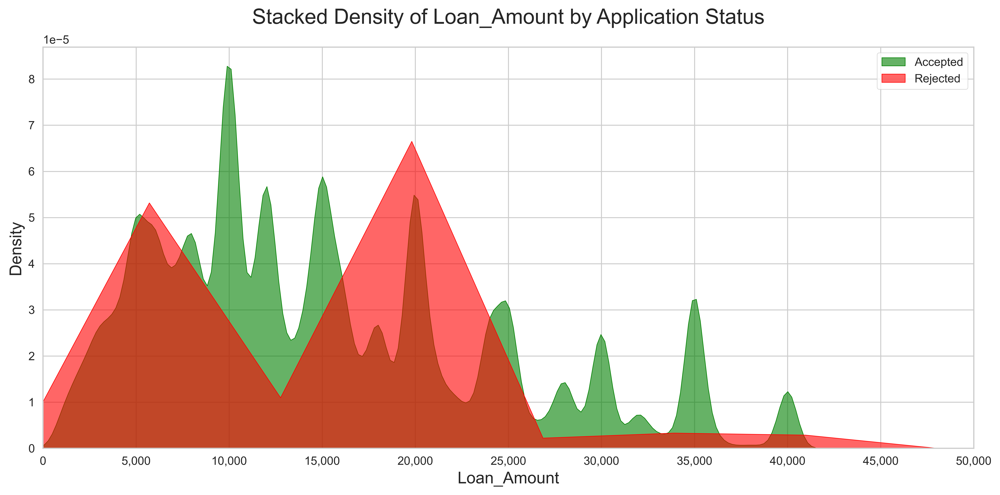

In [21]:
#Stacked Density- Accepted vs Rejected by Loan Amount
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.kdeplot(
    data=Accepted_Rejected[Accepted_Rejected['Application'] == 'Accepted'],
    x='Loan_Amount',
    fill=True,
    label='Accepted',
    color='green',
    alpha=0.6
)
sns.kdeplot(
    data=Accepted_Rejected[Accepted_Rejected['Application'] == 'Rejected'],
    x='Loan_Amount',
    fill=True,
    label='Rejected',
    color='red',
    alpha=0.6
)

plt.title('Stacked Density of Loan_Amount by Application Status', fontsize=18, pad=20)
plt.xlabel('Loan_Amount', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.legend(title='')
plt.xlim(0, 50000)
plt.gca().xaxis.set_major_locator(MultipleLocator(5000))
plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

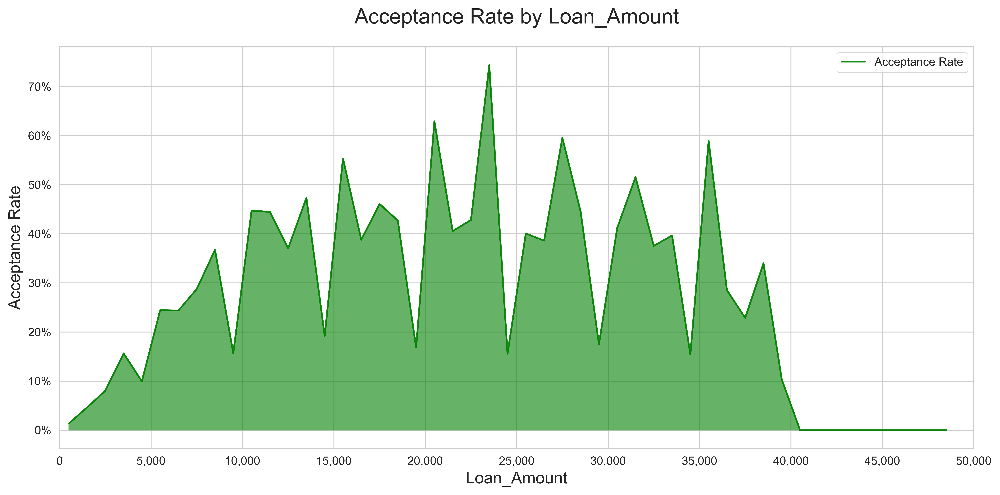

In [22]:
#Bin ACCEPTANCE RATE by Loan Amount
col = 'Loan_Amount'

bins = np.arange(0, 50000, 1000)
Accepted_Rejected['Bin'] = pd.cut(Accepted_Rejected[col], bins)

#Calculate acceptance rate per bin
rate_df = Accepted_Rejected.groupby('Bin', observed=False)['Application'].value_counts().unstack(fill_value=0)
rate_df['Acceptance_Rate'] = rate_df.get('Accepted', 0) / (rate_df.get('Accepted', 0) + rate_df.get('Rejected', 0))

#Use bin midpoints for plotting
bin_midpoints = [interval.mid for interval in rate_df.index]

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

plt.fill_between(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.6)
plt.plot(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.9, label='Acceptance Rate')

plt.title(f'Acceptance Rate by {col}', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xlim(0, 50000)
plt.gca().xaxis.set_major_locator(MultipleLocator(5000))
plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y*100)}%'))
plt.legend(title='')
plt.tight_layout()
plt.show()

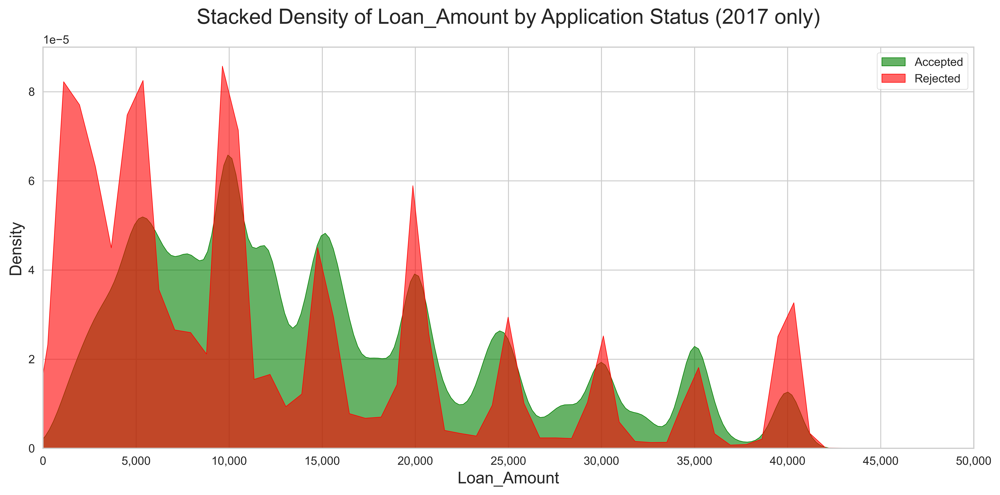

In [23]:
#Stacked Density- Accepted vs Rejected by Loan Amount (2017 only)
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

sns.kdeplot(
    data=Accepted_Rejected_2017[Accepted_Rejected_2017['Application'] == 'Accepted'],
    x='Loan_Amount',
    fill=True,
    label='Accepted',
    color='green',
    alpha=0.6
)
sns.kdeplot(
    data=Accepted_Rejected_2017[Accepted_Rejected_2017['Application'] == 'Rejected'],
    x='Loan_Amount',
    fill=True,
    label='Rejected',
    color='red',
    alpha=0.6
)

plt.title('Stacked Density of Loan_Amount by Application Status (2017 only)', fontsize=18, pad=20)
plt.xlabel('Loan_Amount', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.legend(title='')
plt.xlim(0, 50000)
plt.gca().xaxis.set_major_locator(MultipleLocator(5000))
plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

C:\Users\edjwe\AppData\Local\Temp\ipykernel_10256\2612612190.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Accepted_Rejected_2017['Bin'] = pd.cut(Accepted_Rejected_2017[col], bins)


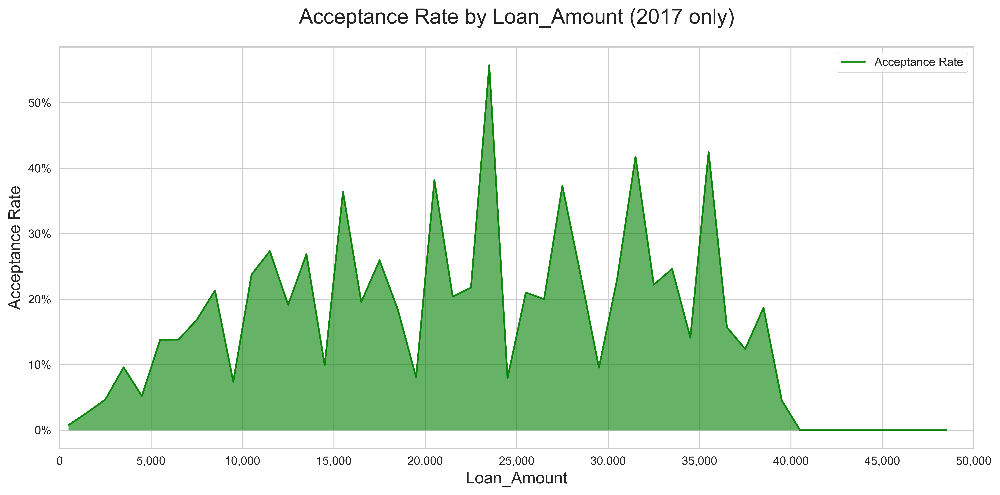

In [24]:
#Bin ACCEPTANCE RATE by Loan Amount (2017 only)
col = 'Loan_Amount'

bins = np.arange(0, 50000, 1000)
Accepted_Rejected_2017['Bin'] = pd.cut(Accepted_Rejected_2017[col], bins)

#Calculate acceptance rate per bin
rate_df = Accepted_Rejected_2017.groupby('Bin', observed=False)['Application'].value_counts().unstack(fill_value=0)
rate_df['Acceptance_Rate'] = rate_df.get('Accepted', 0) / (rate_df.get('Accepted', 0) + rate_df.get('Rejected', 0))

#Use bin midpoints for plotting
bin_midpoints = [interval.mid for interval in rate_df.index]

sns.set_style('whitegrid')
plt.figure(figsize=(12, 6), dpi=300)

plt.fill_between(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.6)
plt.plot(bin_midpoints, rate_df['Acceptance_Rate'], color='green', alpha=0.9, label='Acceptance Rate')

plt.title(f'Acceptance Rate by {col} (2017 only)', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Acceptance Rate', fontsize=15)
plt.xlim(0, 50000)
plt.gca().xaxis.set_major_locator(MultipleLocator(5000))
plt.gca().xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{int(y*100)}%'))
plt.legend(title='')
plt.tight_layout()
plt.show()

In [25]:
#---ACCEPTED ONLY Plotting---

In [59]:
Accepted_Only['Repayment_Rate'] = np.where(Accepted_Only['Loan_Status'] == 'Fully Paid', 100, 0)
Accepted_Only.head()

,Loan_Status,Term,Grade,Sub_Grade,Risk_Score,Employment_Length,Income_Verification_Status,Income_Annual,Existing_Debt_Payments_Annual,Loan_Amount,Debt-Income,Loan-Income,Int_Rate,ROI,Return_Total,Principal_Received,Interest_Received,LateFees_Received,Year,Mortgage_Accounts,Home_Ownership,State,Loan_Purpose,Repayment_Rate
0,Fully Paid,36 months,C,C4,677,10+ years,Not Verified,"55,000","325,050","3,600",6,7,14,23,"4,422","3,600",822,0,2015,1,MORTGAGE,PA,debt_consolidation,100
1,Fully Paid,36 months,C,C1,717,10+ years,Not Verified,"65,000","1,043,900","24,700",16,38,12,4,"25,680","24,700",980,0,2015,4,MORTGAGE,SD,small_business,100
2,Fully Paid,60 months,B,B4,697,10+ years,Not Verified,"63,000","679,140","20,000",11,32,11,14,"22,706","20,000","2,706",0,2015,5,MORTGAGE,IL,home_improvement,100
3,Fully Paid,60 months,F,F1,697,3 years,Source Verified,"104,433","2,649,465","10,400",25,10,22,13,"11,740","10,400","1,340",0,2015,6,MORTGAGE,PA,major_purchase,100
4,Fully Paid,36 months,C,C3,692,4 years,Source Verified,"34,000","346,800","11,950",10,35,13,15,"13,709","11,950","1,759",0,2015,0,RENT,GA,debt_consolidation,100


In [60]:
#Define Annual Line Plot
def annual_trend_plot(col1, col2, col1_color = 'blue', col2_color = 'purple', df = Accepted_Only, y_format='number', year_col='Year', ylabel=''):
    df_grouped = df.groupby(year_col)[[col1, col2]].mean().reset_index()

    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 6), dpi=300)

    plt.plot(df_grouped[year_col], df_grouped[col1],
             marker='o', label= col1, color=col1_color, linewidth=2)
    plt.plot(df_grouped[year_col], df_grouped[col2],
             marker='o', label=col2, color=col2_color, linewidth=2)

    plt.title(f'Annual Trend: {col1} vs {col2}', fontsize=18, pad=15)
    plt.xlabel('Year', fontsize=15)
    plt.ylabel(ylabel, fontsize=15)
    plt.xticks(df_grouped[year_col], rotation=0)
    
    if y_format == 'percent':
        plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:.0f}%'))
    else:
        plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:,.0f}'))

    plt.legend(title='', fontsize=11, loc='best')
    plt.tight_layout()
    plt.show()

In [94]:
#Define 1x3 Histogram function
def custom_kde_subplots_1x3(frame_name, col1, col2, col3, x_format='number'):
    sns.set_style('whitegrid')
    cols = [col1, col2, col3]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        ax = axes[i]

        if col not in frame_name.columns:
            ax.text(0.5, 0.5, f"'{col}' not found", ha='center', va='center', fontsize=12)
            ax.axis('off')
            continue

        data = frame_name[col].dropna()
        if data.empty:
            ax.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
            ax.axis('off')
            continue

        mean_col = data.mean()
        median_col = data.median()
        mode_col = data.mode().iloc[0] if not data.mode().empty else None
        skew_col = data.skew()
        kurt_col = data.kurt()

        sns.histplot(data, bins=100, kde=True, color='skyblue', ax=ax)

        ax.axvline(mean_col, color='r', linestyle='--', label=f'Mean: {mean_col:,.0f}')
        ax.axvline(median_col, color='g', linestyle='-', label=f'Median: {median_col:,.0f}')
        if mode_col is not None:
            ax.axvline(mode_col, color='b', linestyle='-.', label=f'Mode: {mode_col:,.0f}')

        ax.annotate(
            f'Skewness: {skew_col:.2f}\nKurtosis: {kurt_col:.2f}',
            xy=(0.98, 0.95), xycoords='axes fraction',
            fontsize=10, ha='right', va='top',
            bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='skyblue')
        )

        ax.set_title(col, fontsize=13)
        ax.legend(fontsize=9)
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')

        ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:,.0f}'))
        if x_format == 'percent':
            ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:.0f}%'))
        else:
            ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x:,.0f}'))

    plt.tight_layout()
    plt.show()

In [118]:
def custom_bar_subplots_2x2(frame_name, col1, col2=None, col3=None, col4=None):
    sns.set_style('whitegrid')
    cols = [c for c in [col1, col2, col3, col4] if c is not None]

    fig, axes = plt.subplots(2, 2, figsize=(18, 10))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        ax = axes[i]

        if col not in frame_name.columns:
            ax.text(0.5, 0.5, 'Column Not Found', ha='center', va='center', fontsize=12)
            ax.set_title(col, fontsize=13)
            ax.axis('off')
            continue

        data = frame_name[col].dropna()
        if data.empty:
            ax.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
            ax.set_title(col, fontsize=13)
            ax.axis('off')
            continue

        counts = data.value_counts().sort_index()

        sns.barplot(
            x=list(range(len(counts))),
            y=counts.values,
            color='blue',
            ax=ax
        )

        mean_val = counts.values.mean()
        ax.axhline(mean_val, color='r', linestyle='--', label=f'Mean Count: {mean_val:,.0f}')
        ax.legend(fontsize=9)

        # Set title and labels
        ax.set_title(col, fontsize=13)
        ax.set_xlabel('')
        ax.set_ylabel('Count')

        # Replace numeric x-ticks with category labels
        ax.set_xticks(list(range(len(counts))))
        ax.set_xticklabels(counts.index, rotation=45)

        # Format y-axis
        ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{y:,.0f}'))

    #Hide unused subplots
    for j in range(len(cols), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

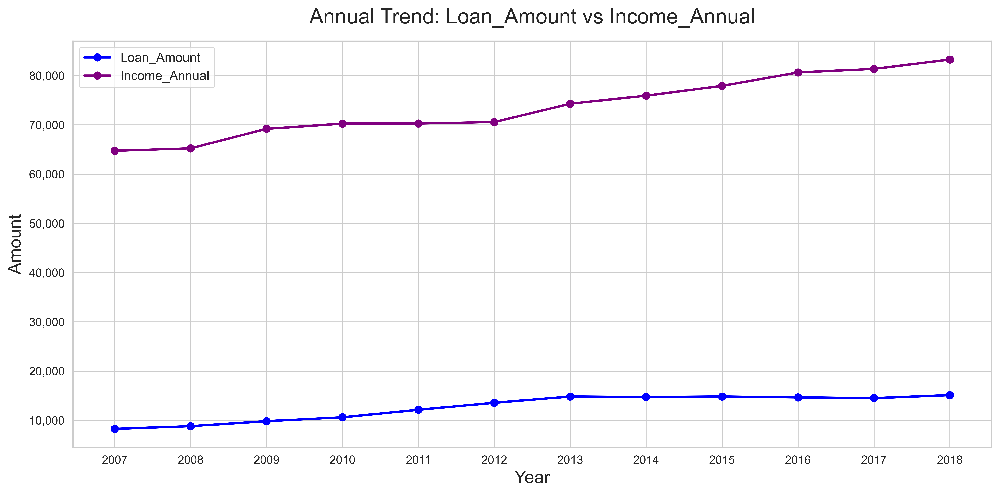

In [55]:
#Line PLot- Loan_Amount vs Income
annual_trend_plot('Loan_Amount', 'Income_Annual')

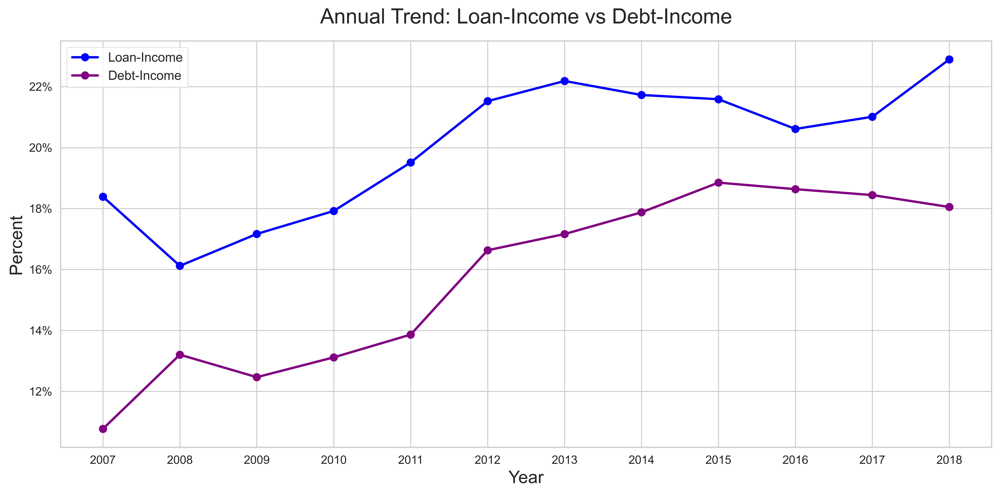

In [62]:
#Line PLot- Loan-Income vs Debt-Income
annual_trend_plot('Loan-Income', 'Debt-Income', y_format='percent', ylabel = 'Percent')

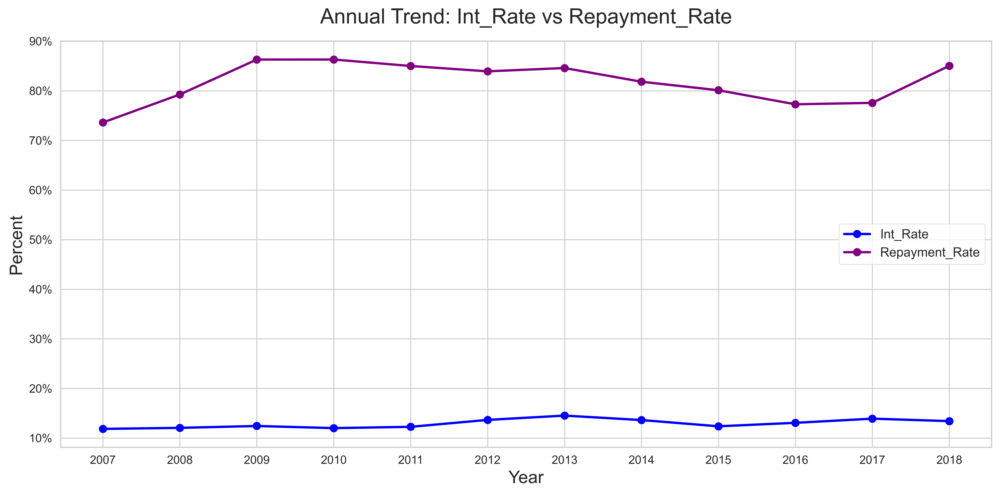

In [61]:
#Line PLot- Interest Rate vs Repayment Rate
annual_trend_plot('Int_Rate', 'Repayment_Rate', y_format='percent', ylabel = 'Percent')

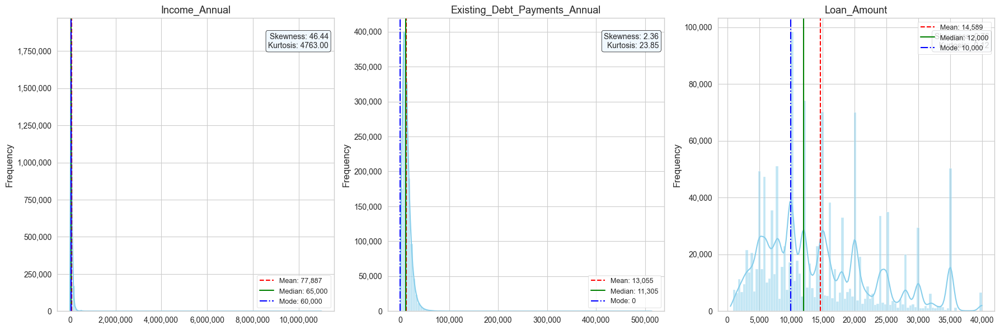

In [95]:
#Histograms- Income, Debt Payments, Loan Amounts
custom_kde_subplots_1x3(Accepted_Only, 'Income_Annual', 'Existing_Debt_Payments_Annual', 'Loan_Amount')

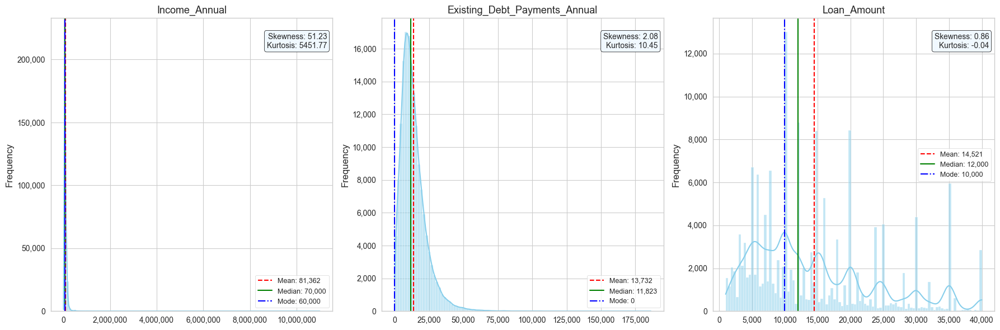

In [96]:
#Histograms- Income, Debt Payments, Loan Amounts (2017 only)
custom_kde_subplots_1x3(Accepted_Only_2017, 'Income_Annual', 'Existing_Debt_Payments_Annual', 'Loan_Amount')

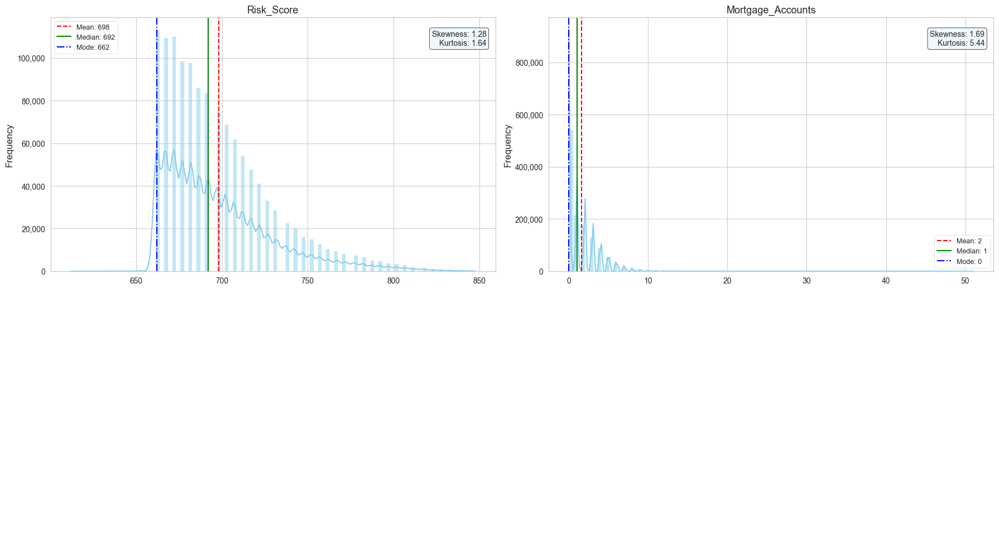

In [92]:
#Histograms- Risk_Score, Mortgage Accounts
custom_kde_subplots_2x2(Accepted_Only, 'Risk_Score', 'Mortgage_Accounts', None, None)

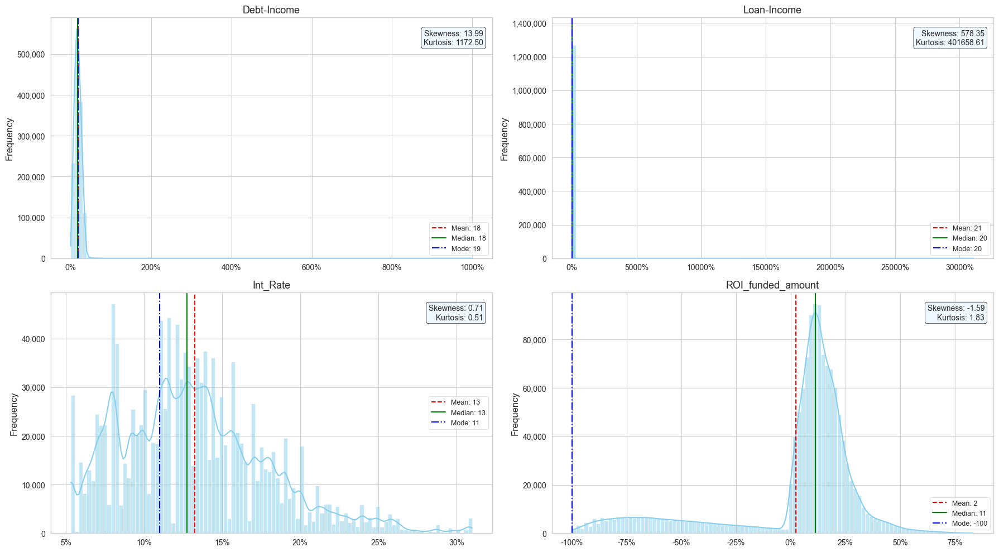

In [154]:
#Histograms: Debt-Income, Loan-Income, Interest Rate, ROI_funded
custom_kde_subplots_2x2(Accepted_Only, 'Debt-Income', 'Loan-Income', 'Int_Rate', 'ROI_funded_amount', x_format='percent')

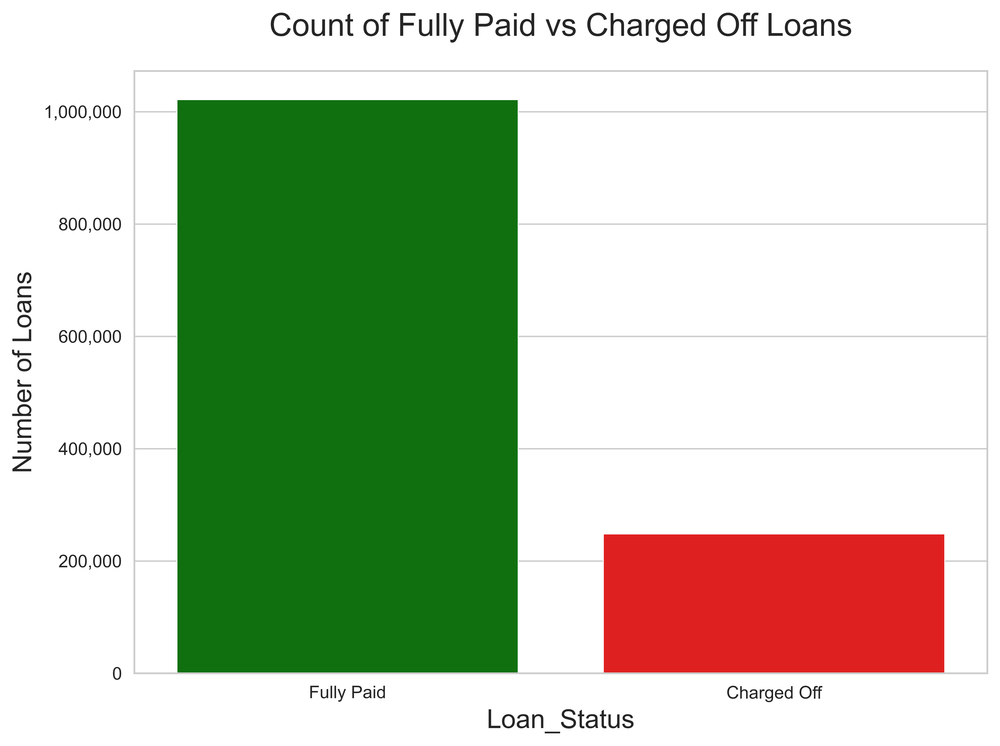

In [103]:
#Barplot- Counts by Loan Status
col = 'Loan_Status'

paid_counts = Accepted_Only.loc[Accepted_Only[col] == 'Fully Paid', col].value_counts().sum()
default_counts = Accepted_Only.loc[Accepted_Only[col] == 'Charged Off', col].value_counts().sum()

combined = pd.DataFrame({
    col: ['Fully Paid', 'Charged Off'],
    'Count': [paid_counts, default_counts]
})

sns.set_style('whitegrid')
plt.figure(figsize=(8, 6), dpi=300)

sns.barplot(
    data=combined,
    x=col,
    y='Count',
    hue=col,
    palette=['green', 'red']
)

plt.title('Count of Fully Paid vs Charged Off Loans', fontsize=18, pad=20)
plt.xlabel(col, fontsize=15)
plt.ylabel('Number of Loans', fontsize=15)
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()

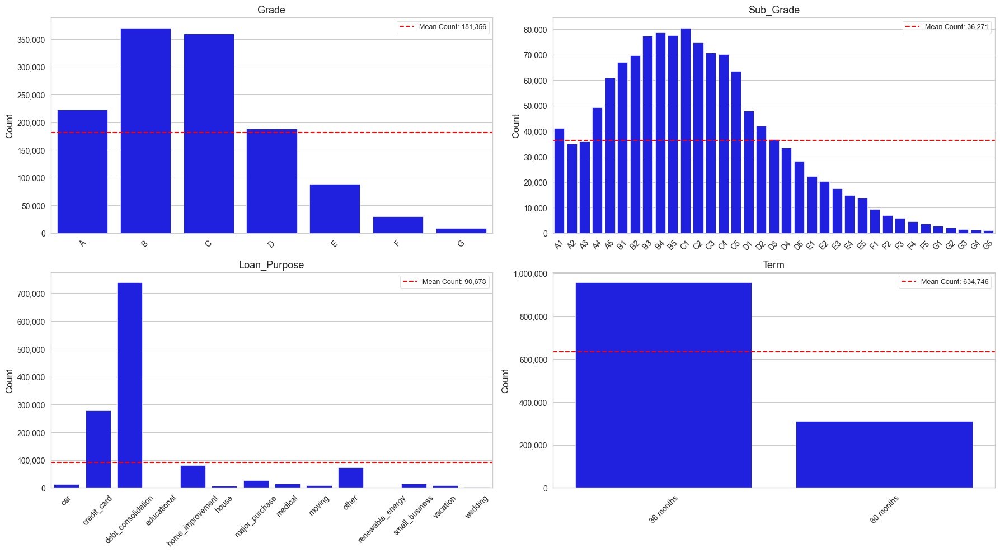

In [119]:
#Bar Plots Distribution- Grade, Sub Grade, Loan Purpose, Term
custom_bar_subplots_2x2(Accepted_Only, 'Grade', 'Sub_Grade', 'Loan_Purpose', 'Term')

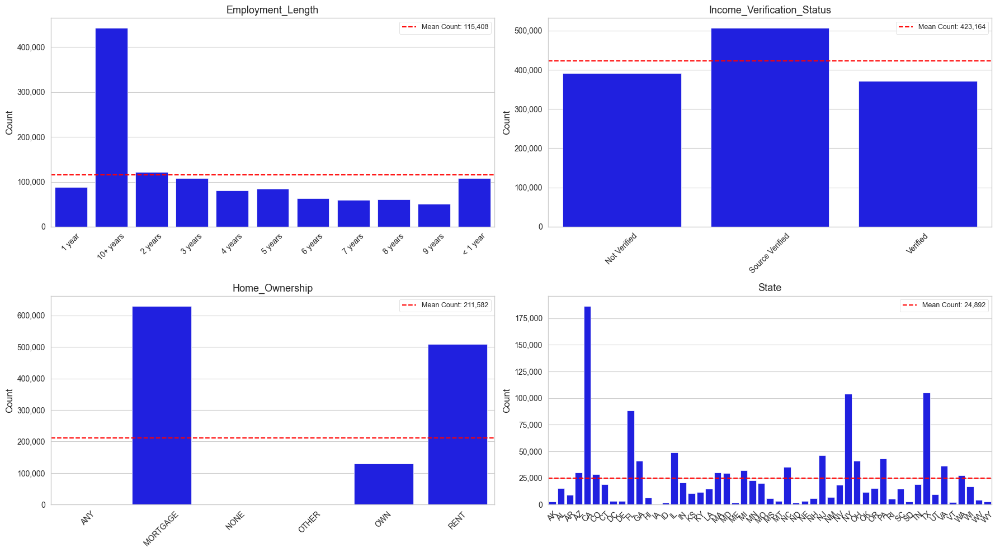

In [120]:
#Bar Plots Distribution- Employment Length, Income Verification, Home Ownership, State
custom_bar_subplots_2x2(Accepted_Only, 'Employment_Length', 'Income_Verification_Status', 'Home_Ownership', 'State')

In [199]:
#Layered Density Function Definition: Fully Paid vs Charged Off
def stacked_density_status(col, paidclip=0, chargedoffclip=-100, tickspace=10):
    
    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 6), dpi=300)
    
    # Fully Paid KDE
    sns.kdeplot(
        data=Accepted_Only[Accepted_Only['Loan_Status'] == 'Fully Paid'],
        x=col,
        fill=True,
        label='Fully Paid',
        color='green',
        alpha=0.6,
        bw_adjust=.3,
        clip=(paidclip, None)
    )
    
    sns.kdeplot(
        data=Accepted_Only[Accepted_Only['Loan_Status'] == 'Charged Off'],
        x=col,
        fill=True,
        label='Charged Off',
        color='red',
        alpha=0.6,
        bw_adjust=.3,
        clip=(chargedoffclip, None)
    )
    
    plt.title(f'Stacked Density of {col} by Loan Status', fontsize=18, pad=20)
    plt.xlabel(col, fontsize=15)
    plt.ylabel('Density', fontsize=15)
    plt.legend(title='')
    plt.gca().xaxis.set_major_locator(MultipleLocator(tickspace))
    plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}%'))
    plt.tight_layout()
    plt.show()

In [236]:
#Layered Histogram Function Definition: Fully Paid vs Charged Off
def stacked_hist_status(col, tickspace=10, bins=500):
    
    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 6), dpi=300)
    
    sns.histplot(
        data=Accepted_Only,
        x=col,
        hue='Loan_Status',
        multiple='layer',
        bins=bins,
        palette={'Fully Paid': 'green', 'Charged Off': 'red'},
        alpha=0.5,
        edgecolor=None,
        legend=False
    )
    
    #Stats
    paid = Accepted_Only[Accepted_Only['Loan_Status'] == 'Fully Paid'][col]
    charged = Accepted_Only[Accepted_Only['Loan_Status'] == 'Charged Off'][col]
    
    stats = {
        'Fully Paid': {
            'color': 'green',
            'mean': paid.mean(),
            'min': paid.min(),
            'max': paid.max(),
            'count': paid.count(),
            'ha': 'right',
            'xpos': plt.gca().get_xlim()[1]
        },
        'Charged Off': {
            'color': 'red',
            'mean': charged.mean(),
            'min': charged.min(),
            'max': charged.max(),
            'count': charged.count(),
            'ha': 'left',
            'xpos': plt.gca().get_xlim()[0]
        }
    }
    
    ymax = plt.gca().get_ylim()[1]
    
    for status, s in stats.items():
        color = s['color']
        
        #Vertical lines
        plt.axvline(s['min'], color=color, linestyle=':', linewidth=1.5)
        plt.axvline(s['mean'], color=color, linestyle='--', linewidth=2)
        plt.axvline(s['max'], color=color, linestyle=':', linewidth=1.5)
        
        #Summary text box
        plt.text(
            s['xpos'], ymax * 0.95,
            f"{status}\n"
            f"Mean: {s['mean']:.0f}%\n"
            f"Min: {s['min']:.0f}%\n"
            f"Max: {s['max']:.0f}%\n"
            f"Count: {s['count']:,}",
            color=color, ha=s['ha'], va='top', fontsize=11, fontweight='bold',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor=color)
        )
    
    plt.title(f'Histogram of {col} by Loan Status', fontsize=18, pad=20)
    plt.xlabel(col, fontsize=15)
    plt.ylabel('Count', fontsize=15)
    plt.gca().xaxis.set_major_locator(MultipleLocator(tickspace))
    plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}%'))
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{int(x):,}'))
    plt.tight_layout()
    plt.show()

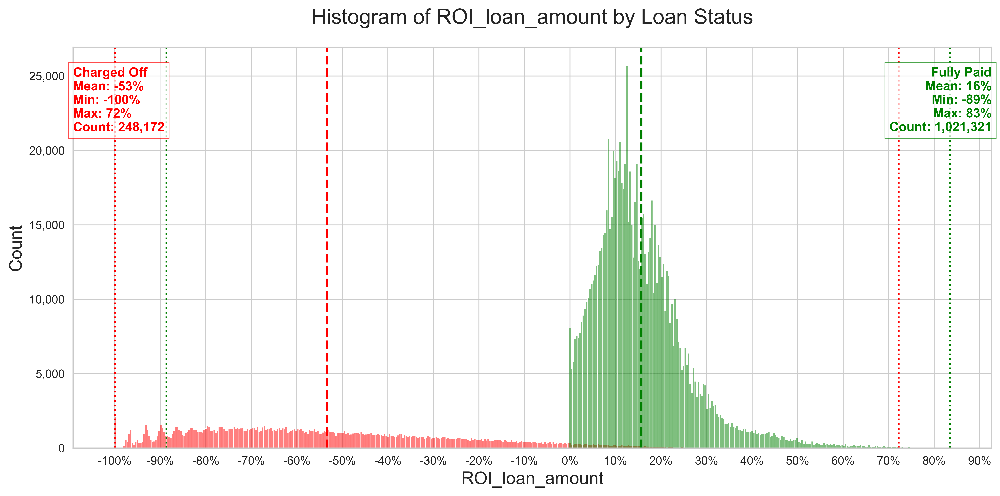

In [237]:
stacked_hist_status('ROI_loan_amount')

In [156]:
#ROI_loan Range of Paid Loans
print('Min ROI:', Accepted_Only_Paid['ROI_loan_amount'].min())
print('Max ROI:', Accepted_Only_Paid['ROI_loan_amount'].max())
Accepted_Only_Paid['ROI_loan_amount'].describe()
#print(Accepted_Only_Paid['ROI'].value_counts(dropna=False).sort_index())

Min ROI: -88.6832
Max ROI: 83.4629


count   1,021,321
mean           16
std            11
min           -89
25%             9
50%            14
75%            20
max            83
Name: ROI_loan_amount, dtype: float64

In [157]:
#ROI_loan Range of Charged Off Loans
print('Min ROI:', Accepted_Only_ChargedOff['ROI_loan_amount'].min())
print('Max ROI:', Accepted_Only_ChargedOff['ROI_loan_amount'].max())
Accepted_Only_ChargedOff['ROI_loan_amount'].describe()
#print(Accepted_Only_ChargedOff['ROI'].value_counts(dropna=False).sort_index())

Min ROI: -100.0
Max ROI: 72.1845882352941


count   248,172
mean        -53
std          28
min        -100
25%         -76
50%         -58
75%         -35
max          72
Name: ROI_loan_amount, dtype: float64

In [161]:
Accepted_Only_Paid['NetPrincipal_LoanAmount'] = Accepted_Only_Paid['Principal_Received'] - Accepted_Only_Paid['Loan_Amount']
Accepted_Only_Paid['NetPrincipal_FundedAmount'] = Accepted_Only_Paid['Principal_Received'] - Accepted_Only_Paid['Funded_Amount']

C:\Users\edjwe\AppData\Local\Temp\ipykernel_10256\4021921138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Accepted_Only_Paid['NetPrincipal_LoanAmount'] = Accepted_Only_Paid['Principal_Received'] - Accepted_Only_Paid['Loan_Amount']
C:\Users\edjwe\AppData\Local\Temp\ipykernel_10256\4021921138.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Accepted_Only_Paid['NetPrincipal_FundedAmount'] = Accepted_Only_Paid['Principal_Received'] - Accepted_Only_Paid['Funded_Amount']


In [167]:
Accepted_Only_Paid[Accepted_Only_Paid['ROI_loan_amount'] < 0].head()

,Loan_Status,Term,Grade,Sub_Grade,Risk_Score,Employment_Length,Income_Verification_Status,Income_Annual,Existing_Debt_Payments_Annual,Debt-Income,Loan-Income,Int_Rate,ROI_loan_amount,ROI_funded_amount,Loan_Amount,Funded_Amount,Return_Total,Principal_Received,Interest_Received,LateFees_Received,Year,Mortgage_Accounts,Home_Ownership,State,Loan_Purpose,NetPrincipal_LoanAmount,NetPrincipal_FundedAmount
861970,Fully Paid,60 months,D,D3,707,6 years,Verified,"40,000","7,788",19,44,17,-24,48,"17,500","8,950","13,227","8,950","4,277",0,2011,0,RENT,CA,small_business,"-8,550",0
861979,Fully Paid,60 months,D,D4,687,5 years,Verified,"44,000","8,268",19,48,18,-14,33,"20,975","13,575","18,112","13,575","4,537",0,2011,0,MORTGAGE,GA,credit_card,"-7,400",0
861989,Fully Paid,60 months,D,D3,727,3 years,Verified,"150,000","11,265",8,23,17,-17,31,"35,000","22,075","28,887","22,075","6,812",0,2011,0,MORTGAGE,NY,home_improvement,"-12,925",0
862005,Fully Paid,60 months,B,B3,742,4 years,Verified,"47,800","4,799",10,42,12,-24,19,"20,000","12,800","15,169","12,800","2,369",0,2011,0,MORTGAGE,VA,debt_consolidation,"-7,200",0
862125,Fully Paid,60 months,D,D3,697,10+ years,Verified,"109,000","8,448",8,19,17,-16,49,"21,000","11,800","17,608","11,800","5,808",0,2011,0,MORTGAGE,NJ,debt_consolidation,"-9,200",0


In [162]:
#NetPrincipal based on Loan Amount
print('Min:', Accepted_Only_Paid['NetPrincipal_LoanAmount'].min())
print('Max:', Accepted_Only_Paid['NetPrincipal_LoanAmount'].max())
Accepted_Only_Paid['NetPrincipal_LoanAmount'].describe()

Min: -21150.0
Max: 0.25


count   1,021,321
mean           -9
std           267
min       -21,150
25%             0
50%             0
75%             0
max             0
Name: NetPrincipal_LoanAmount, dtype: float64

In [165]:
#NetPrincipal based on Funded Amount
print('Min:', Accepted_Only_Paid['NetPrincipal_FundedAmount'].min())
print('Max:', Accepted_Only_Paid['NetPrincipal_FundedAmount'].max())
Accepted_Only_Paid['NetPrincipal_FundedAmount'].describe()

Min: -1.9699999999993452
Max: 0.25


count   1,021,321
mean           -0
std             0
min            -2
25%             0
50%             0
75%             0
max             0
Name: NetPrincipal_FundedAmount, dtype: float64

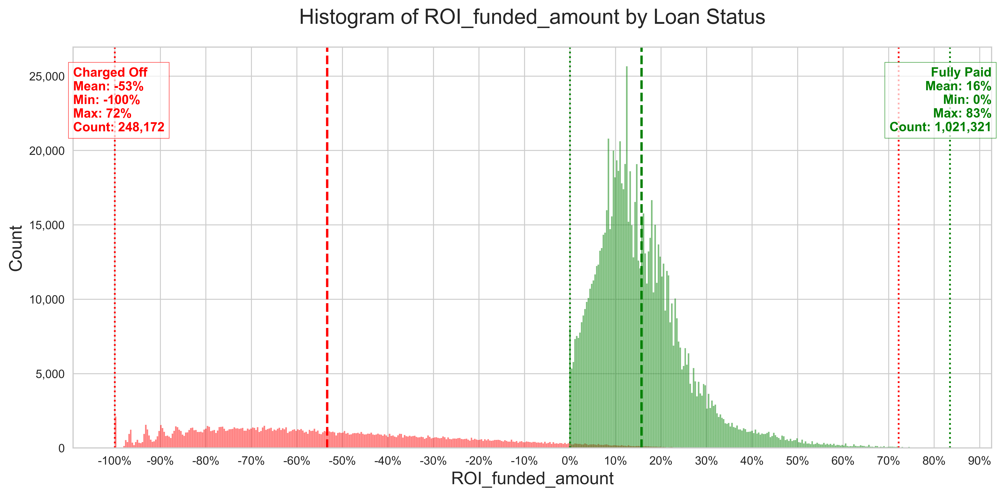

In [238]:
stacked_hist_status('ROI_funded_amount')

In [174]:
print((Accepted_Only['ROI_loan_amount'] - Accepted_Only['ROI_funded_amount']).describe())

count   1,269,493
mean           -0
std             1
min          -122
25%             0
50%             0
75%             0
max             0
dtype: float64
